In [41]:
import pandas as pd
import plotly.express as px
from scipy.stats import f_oneway
from dython import nominal

In [42]:
df=pd.read_csv('data/Global_Superstore2.csv', encoding = "ISO-8859-1")

In [43]:
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,32298,CA-2012-124891,31-07-2012,31-07-2012,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,TEC-AC-10003033,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical
1,26341,IN-2013-77878,05-02-2013,07-02-2013,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,FUR-CH-10003950,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical
2,25330,IN-2013-71249,17-10-2013,18-10-2013,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,TEC-PH-10004664,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium
3,13524,ES-2013-1579342,28-01-2013,30-01-2013,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,TEC-PH-10004583,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium
4,47221,SG-2013-4320,05-11-2013,06-11-2013,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,TEC-SHA-10000501,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical


# Entfernen aller Spalten, die in diesem Notebook nicht untersucht werden

In [44]:
def deleteColumns(pColumns):
    for i in range(0,len(pColumns)):
        del df[pColumns[i]]

In [45]:
deleteColumns(["Order Date", "Ship Mode", "Customer ID", "Customer Name", "Segment", "City", "State", "Country", "Market", "Region", "Postal Code", "Product ID", "Product Name", "Category", "Sub-Category"])

In [46]:
df.head()

,Row ID,Order ID,Ship Date,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,32298,CA-2012-124891,31-07-2012,2309.650,7,0.0,762.1845,933.57,Critical
1,26341,IN-2013-77878,07-02-2013,3709.395,9,0.1,-288.7650,923.63,Critical
2,25330,IN-2013-71249,18-10-2013,5175.171,9,0.1,919.9710,915.49,Medium
3,13524,ES-2013-1579342,30-01-2013,2892.510,5,0.1,-96.5400,910.16,Medium
4,47221,SG-2013-4320,06-11-2013,2832.960,8,0.0,311.5200,903.04,Critical


# Definieren von Funktionen, die die "Clean Code Guidelines" erfüllen und im ganzen Dokument zur Analyse von Attributbeziehungen genutzt werden

In [47]:
def countColumn(pColumn, pColumnName, pYName):
    groups=df.groupby(pColumn)
    amount=groups.count()[["Row ID"]]
    dataset = pd.DataFrame({pColumnName: list(df.groupby(pColumn).groups.keys()), pYName: amount["Row ID"]}, columns=[pColumnName, pYName])
    colour=amount["Row ID"]
    return dataset,colour

In [48]:
def dfOfAverageMeans(pColumn, pValue, pColumnName, pYName):
    means = []
    groups=df.groupby(pColumn)
    for index,group in groups:
        current = group[pValue]
        currentMean = current.mean()
        means.append(currentMean)
    dataset = pd.DataFrame({pColumnName: list(df.groupby(pColumn).groups.keys()), pYName: means}, columns=[pColumnName, pYName])
    return dataset, means

In [49]:
def numberOfTransactions(pColumn):
    count_r=df.groupby(by=pColumn).count()[["Row ID"]].rename(columns={"Row ID":"Number of Transactions"})
    return count_r.sort_values(by="Number of Transactions")

In [50]:
def howOftenDoAmountsAppear(pColumn):
    counter=df.groupby(by=pColumn).count()[["Row ID"]].rename(columns={"Row ID":"Number of Transactions"})
    counting_amounts=counter.groupby(['Number of Transactions']).size().reset_index(name='counts')
    counting_amounts.sort_values(by="Number of Transactions")
    return counting_amounts

In [51]:
def calculateAnovaScore(pColumn1, pColumn2):
    CategoryGroupLists=df.groupby(pColumn1)[pColumn2].apply(list)
    AnovaResults = f_oneway(*CategoryGroupLists)
    print('P-Wert für Anova ist: ', AnovaResults[1])
    print('F Score für Anova ist: ', AnovaResults[0])
    if AnovaResults[1] < 0.05:
        print(f"Der Unterschied der {pColumn2}-Mittelwerte zwischen den verschiedenen Gruppen von {pColumn1} ist signifikant, da der p-Wert unter 0.05 liegt.")

# Berechnen und Erstellen der generellen Korrelations Heatmap

### Wenn im Folgenden von Werten aus der Korrelationstabelle/-heatmap gesprochen wird, ist diese gemeint

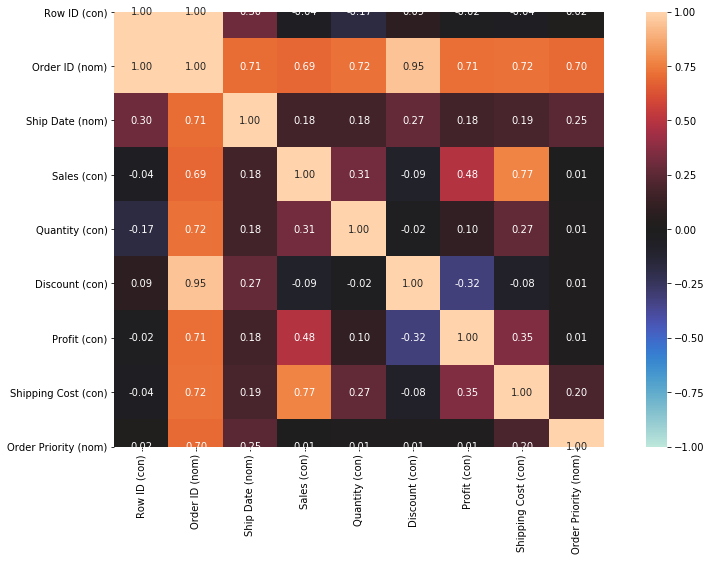

{'corr':                       Row ID (con)  Order ID (nom)  Ship Date (nom)  \
 Row ID (con)              1.000000        0.998199         0.303445   
 Order ID (nom)            0.998199        1.000000         0.709424   
 Ship Date (nom)           0.303445        0.709424         1.000000   
 Sales (con)              -0.043889        0.690352         0.175811   
 Quantity (con)           -0.173483        0.719210         0.178751   
 Discount (con)            0.087594        0.952600         0.274150   
 Profit (con)             -0.019037        0.711870         0.178438   
 Shipping Cost (con)      -0.039078        0.723333         0.187764   
 Order Priority (nom)      0.016879        0.699114         0.246984   
 
                       Sales (con)  Quantity (con)  Discount (con)  \
 Row ID (con)            -0.043889       -0.173483        0.087594   
 Order ID (nom)           0.690352        0.719210        0.952600   
 Ship Date (nom)          0.175811        0.178751        0.

In [52]:
nominal.associations(df,figsize=(15,8),mark_columns=True)

# 1. Analyse des Attribut Sales

#### Die Methoden für Prüfungen der Gruppengrößen und Aussagekraft der Gruppen spielen hier keine Rolle mehr, da numerische Attribute nicht gruppiert werden. Es kommt also nur auf die direkte Beziehung zum Profit an

## 1.1 Berechnen der Korrelationswerte zwischen Sales und Profit

Wert aus Heatmap: 0,48

AnovaScore spielt hier auch keine Rolle, da er auch der Berechnung kategorischer Korrelationen dient.

## 1.2 Grafische Korrelation zwischen Sales und Profit

In [53]:
fig = px.scatter(x=df.Sales, y=df.Profit, labels={'x':'Sales', 'y':'Profit'}, color=df.Profit)
fig.show()

## 1.3 Fazit

Der hohe rechnerische Korrelationswert spricht schon dafür, dass Sales gut geeignet ist. Der Verlauf des Streudiagramms bestätigt dies, da grob der Zusammenhan ersichtlich wird, dass ein höherer Wert für Sales einen höheren Profit bedeutet (abgesehen von einigen Ausreißerwerte, die bei dieser Datenmenge aber normal sind). Daher scheint Sales zur Vorhersage des Profits gut geeignet zu sein.

# 2. Analyse des Attributs Quantity

Obwohl Quantity numerische Werte hat, wird es wie ein kategorisches Attribut behandelt. Denn es ist festgelegt, dass die Werte diesen bestimmten Kategorien entsprechen und keine Werte dazwischen annehmen. Es gibt ja keine Quantity von 1,5 o.Ä.

## 2.1 Verteilung welche Quantity wie viele Transaktionen hat

In [54]:
result,colour = countColumn("Quantity","All Quantities","Number of transactions")
fig = px.bar(result, x="All Quantities", y="Number of transactions", color=colour)
fig.show()

## 2.2 Prüfen ob jede Gruppe genug Aussagekraft hat

In [55]:
numberOfTransactions("Quantity")

,Number of Transactions
Quantity,
13,83
11,156
12,176
14,186
10,276
9,987
8,1361
7,2385
6,3020


Die Anzahl Transaktionen pro Kategorie ist noch in Ordnung. Außerdem sind im Sachzusammenhang niedrigere Quantities viel wahrscheinlicher, welche dann durch genug Transaktionen zuverlässig sind.

## 2.3.1 Rechnerische Bestimmung der Korrelation zwischen Quantity und Profit

Wert aus Heatmap: 0,1

In [56]:
calculateAnovaScore("Quantity","Profit")

P-Wert für Anova ist:  3.7061159696952474e-124
F Score für Anova ist:  47.9951795523927
Der Unterschied der Profit-Mittelwerte zwischen den verschiedenen Gruppen von Quantity ist signifikant, da der p-Wert unter 0.05 liegt.


## 2.3.2 Diagramm zur Visualisierung der Beziehung zwischen Quantity und Profit

#### a) Balkendiagramm

In [57]:
result,means = dfOfAverageMeans("Quantity","Profit", "All Quantities", "Average Profit")
fig = px.bar(result, x="All Quantities", y="Average Profit", color=means)
fig.show()

Es scheint einen Zusammenhang zu geben, dass eine höhere Quantity zu einem höheren Profit führt. Die Werte für die Quantity 12 und 13 passen hier nicht ins Bild, sind aber wahrscheinlich Ausreißer, da speziell diese Kategorien wenig Transaktione haben.

#### b) Box Plot

In [58]:
result,means = dfOfAverageMeans("Quantity", "Profit", "All Quantities", "Average Profit")
fig = px.box(result, y="Average Profit")
fig.show()

#### c) Streudiagramm

In [59]:
result,means = dfOfAverageMeans("Quantity", "Profit", "All Quantities", "Average Profit")
fig = px.scatter(result,x="All Quantities", y="Average Profit")
fig.show()

## 2.4 Fazit

Auch wenn der Heatmap-Wert und F-Score nicht besonders hoch sind, zeigt insbesondere das Balkendiagramm einen angenäherten linearen Zusammenhang zwischen Quantity und Profit. Eine höhere Quantity scheint für einen höheren Profit zu sorgen. Aufgrund dieses sinnvollen Zusammenhangs wird Quantity in das spätere Modell übernommmen.

# 3. Analyse des Attributs Shipping Cost

hier greift die selbe Herangehensweise wie bei Sales

## 3.1 Rechnerische Prüfung der Korrelation zwischen Shipping Cost und Profit

Wert aus Heatmap: 0,35

## 3.2 Diagramm zur Visualisierung dieses Zusammenhangs

In [60]:
fig = px.scatter(x=df["Shipping Cost"], y=df.Profit, labels={'x':'Shipping Cost', 'y':'Profit'}, color=df["Profit"])
fig.show()

## 3.3 Fazit

Der Zusammenhang zwischen Shipping Cost und Profit ist schwerer zu beurteilen. Der rechnerische Wert ist viel höher als der von Quantity, obwohl bei Quantity ein deutlicherer linearer Zusammenhang sichtbar ist. Im Bereich von 0-400 für Shipping Cost fällt nichts auf. Im ereich über 400 gibt es kaum noch negativen Profit. Dieser Zusammenhang ist erwähnenswert. Das spätere Modell sollte Shipping Cost beinhalten, aber ggf. auch einmal ohne trainiert werden.

# 4. Discount

## 4.1 Prüfung ob Gruppierung möglich ist oder es zu viele einzelne Discounts gibt

In [61]:
result,colour = countColumn("Discount","All Quantities","Number of transactions")
fig = px.bar(result, x="All Quantities", y="Number of transactions", color=colour)
fig.show()

In [62]:
numberOfTransactions("Discount")

,Number of Transactions
Discount,
0.850,2
0.550,10
0.570,12
0.650,17
0.602,23
0.320,27
0.202,41
0.370,74
0.402,104


#### Eine Gruppierung scheint nicht sinnvoll zu sein, da es sehr wilkürlich ist, dass eine Gruppe existiert (zu erwarten für eine Gruppierung wären nur Discounts in 0,1 Schritten). Da aber auch alle Werte dazwischen möglich sind und später beim Modell eingegeben werden können, sollte Discount nicht kategorisch, sondern kontinuierlich behandelt werden.

## 4.2 Rechnerische Bestimmung der Korrelation zwischen Discount und Profit

Wert aus Heatmap: -0,32

## 4.3 Diagramm zur Visualierung dieser Beziehung

#### a) Balkendiagramm

In [63]:
result,means = dfOfAverageMeans("Discount", "Profit", "All Discounts", "Average Profit")
fig = px.bar(result, x="All Discounts", y="Average Profit", color=means)
fig.show()

#### c) Streudiagramm

In [64]:
fig = px.scatter(x=df["Discount"], y=df.Profit, labels={'x':'Discount', 'y':'Profit'}, color=df.Profit)
fig.show()

## 4.4 Fazit

Discount sollte definitiv für das finale Modell genutzt werden. Denn es gibt eindeutig eine Korrelation zwischen Discount und Profit. Diese Korrelation ist negativ. Im Sachzusammenhang heißt das, dass je höher der Discount ist, desto niedriger ist der Wert für Profit. Dies zeigt sich sowohl im Korrelationswert,als auch vor Allem im Streudiagramm.

# 5. Analyse des Attributs Order Priority

## 5.1 Verteilung der Anzahl Transaktionen pro Order Priority

In [65]:
result,colour = countColumn("Order Priority","All Order Priorities","Number of transactions")
fig = px.bar(result, x="All Order Priorities", y="Number of transactions", color=colour)
fig.show()

In [66]:
numberOfTransactions("Order Priority")

,Number of Transactions
Order Priority,
Low,2424
Critical,3932
High,15501
Medium,29433


Jede Gruppe hat genug Transaktionen, um valide Vorhersagen zu machen

## 5.2 Analyse der Korrelation mit Profit

### 5.2.1 rechnerische Bestimmung der Korrelation

Wert aus Heatmap: 0,01

In [67]:
calculateAnovaScore("Order Priority","Profit")

P-Wert für Anova ist:  0.22283640166560595
F Score für Anova ist:  1.461514297034312


### 5.2.2 Diagramme zur Visualisierung dieses Zusammenhangs

#### a) Balkendiagramm

In [68]:
result,colour = dfOfAverageMeans("Order Priority", "Profit", "All Order Priorities", "Average Profit")
fig = px.bar(result, x="All Order Priorities", y="Average Profit", color=colour)
fig.show()

#### Box Plot und Streudiagramm haben keine zusätzliche Aussagekraft

## 5.3 Fazit

Die Order Priority steht in keinem Zusammenhang mit dem Profit. Dies zeigt sich im niedrigsten Heatmap Wert (0,01) und darin, dass im Anova Test ein p-Wert von 0,2 rauskommt. Dies bedeutet, dass es keine signifaknte Änderung zwischen der Mittelwerte der Profits pro Gruppe gibt. Die Order Priority wird also nicht mehr betrachtet

In [69]:
del df["Order Priority"]

# 6. Analyse des Attributs Order ID

## 6.1 Prüfen, ob Anzahl Transaktionen pro Gruppe genug ist

In [70]:
numberOfTransactions("Order ID")

,Number of Transactions
Order ID,
ZI-2014-9650,1
MX-2013-130106,1
ID-2012-37642,1
MX-2013-129910,1
ID-2012-37775,1
...,...
IN-2013-42311,13
TO-2014-9950,13
MX-2014-166541,13


In [71]:
howOftenDoAmountsAppear("Order ID")

,Number of Transactions,counts
0,1,12257
1,2,6221
2,3,3205
3,4,1633
4,5,812
5,6,440
6,7,238
7,8,95
8,9,68
9,10,39


über 20000 Transaktionen kommen von Order IDs, die nur 1-3 mal vorkommen

## 6.2 Fazit

Logischerweise ergibt es keinen Sinn die Order ID als Input für eine Vorhersage des Profits zu nutzen, denn eine Order ID ist immer einmalig (hier kommt sie nur mehrfach vor, wenn in einer Order mehrere verschiedene Produkte gekauft wurden, da somit für jedes Produkt eine eigene Transaktion vorliegt) und dient daher nur der Identifizierung eines Datensatzes.Sie steht also in keinem Bezug zum Profit und wird nicht mehr berücksichtigt.

In [72]:
del df["Order ID"]

# 7. Analyse des Attributs Ship Date

Es ergibt keinen Sinn sich den Profit einzelner Tage anzuschauen, da für jeden Tag nur einige Transaktionen vorliegen und somit keine validen Vorhersagen getroffen werden können. Daher werden im Folgenden die Daten einmal auf Monate und einmal auf Quartale aggregiert.

## 7.1 Aufteilen in Quartale

In [73]:
q1 = df[df['Ship Date'].str.contains('-01-|-02-|-03-')]
q2 = df[df['Ship Date'].str.contains('-04-|-05-|-06-')]
q3 = df[df['Ship Date'].str.contains('-07-|-08-|-09-')]
q4 = df[df['Ship Date'].str.contains('-10-|-11-|-12-')]

## 7.2 Aufteilen in Monate

In [74]:
months=["01","02","03","04","05","06","07","08","09","10","11","12"]
months2=["January","February","March","April","May","June","July","August","September","October","November","December"]
month_means=[]
for i in months:
    current = df[df["Ship Date"].str.contains(f"-{i}-")]
    month_means.append(current.Profit.mean())

## 7.3 Korrelation zwischen Ship Date und Profit

rechnerische Korrelationsberechnung nicht möglich, da sich die Werte dann auf das Ship Date mit den einzelnen Tagen und nicht auf die vorgenommenen Gruppierungen beziehen würden

### 7.3.1 Diagramme zur Visualisierung der Zusammenhänge

#### a) Quartale und Profit vergleichen

In [75]:
fig = px.bar(x=["Q1","Q2","Q3","Q4"], y=[q1.Profit.mean(),q2.Profit.mean(),q3.Profit.mean(),q4.Profit.mean()],color=[q1.Profit.mean(),q2.Profit.mean(),q3.Profit.mean(),q4.Profit.mean()], labels={"x":"Quartale","y":"Durchschnittlicher Profit"})
fig.show()

#### b) Monate

In [76]:
fig = px.bar(x=months2, y=month_means,color=month_means, labels={"x":"Monate","y":"Durchschnittlicher Profit"})
fig.show()

## 7.4 Fazit

Es scheint keine direkten Zusammenhang zwischen dem Monat oder dem Quartal, in dem das Produkt einer Transaktion verschifft wurde, und dem Profit zu geben. Neben diesen Ergebnissen aus den Diagrammen, könnte eine potenzielle Korrelation nicht durch rechnerische Werte bestätigt werden. Daher wird das Ship Date nicht mehr berücksichtigt.

In [77]:
del df["Ship Date"]

# Überarbeitetes DataFrame der order-bezogenen Attribute

In [78]:
df

,Row ID,Sales,Quantity,Discount,Profit,Shipping Cost
0,32298,2309.650,7,0.0,762.1845,933.57
1,26341,3709.395,9,0.1,-288.7650,923.63
2,25330,5175.171,9,0.1,919.9710,915.49
3,13524,2892.510,5,0.1,-96.5400,910.16
4,47221,2832.960,8,0.0,311.5200,903.04
...,...,...,...,...,...,...
51285,29002,65.100,5,0.0,4.5000,0.01
51286,35398,0.444,1,0.8,-1.1100,0.01
51287,40470,22.920,3,0.0,11.2308,0.01
51288,9596,13.440,2,0.0,2.4000,0.00
